In [1]:
import sys
print(sys.version)

3.6.5 (default, Mar 30 2018, 06:41:53) 
[GCC 4.2.1 Compatible Apple LLVM 9.0.0 (clang-900.0.39.2)]


In [2]:
!pip3 install --upgrade pip
!pip3 install wget
!pip3 install numpy
!pip3 install pandas

Requirement already up-to-date: pip in ./.venv/lib/python3.6/site-packages (19.0.3)


In [4]:
import os
import wget
import pandas as pd
import numpy as np 
import pytz as tz # better alternatives -> Apache arrow or pendulum
from datetime import datetime

In [6]:
data_dir = os.path.join(".", "data")
os.makedirs(data_dir, exist_ok=True)

In [12]:


url = 'https://storage.googleapis.com/google-code-archive-downloads/v2/code.google.com/locrec/gowalla-dataset.zip' 

src_filename = os.path.join(data_dir, 'gowalla-dataset.zip')
trg_filename = os.path.join(data_dir, 'gowalla_venues.csv') # data/gowalla_venues.csv
import sys  
# reload(sys)  
# sys.setdefaultencoding('utf8')

if not os.path.isfile(trg_filename):
    import shutil
    import zipfile
    import re
    

    wget.download(url, out=src_filename)

    #extract
    zf = zipfile.ZipFile(src_filename, 'r')
    extracted_file = zf.extract('gowalla-dataset/spots.txt', data_dir)
    tmp_filename = shutil.copy(extracted_file, data_dir) # extracfile -> ./data/
    tmp_filename = os.path.join(data_dir, "spots.txt")
    shutil.rmtree(os.path.dirname(extracted_file))

    #preprocess
    regex = re.compile(r'POINT\((\-?\d+\.\d+)\s+(\-?\d+\.\d+)\)')

    with open(tmp_filename, "r") as src, \
         open(trg_filename, "w") as dst  :

        next(src) 
        for line in src: 
            dst.write(regex.sub(r'\2\t\1', line))

    #cleanup
    os.remove(src_filename)
    os.remove(tmp_filename)

In [2]:
!head -n 5 ./data/gowalla_venues.csv

1391604	Conference House Park	40.5017589436	-74.2523431778
1391611	Almer G. Russell Pavilion	40.5022647413	-74.2542636395
3612422	Conference House	40.5000644614	-74.2490418254
3612431	Billop House	40.5000644614	-74.2490418254
1391499	Biddle House	40.5054829933	-74.2541456223


In [7]:
filename = os.path.join(data_dir, 'gowalla_venues.csv')

dfv = pd.read_csv(filename, sep='\t', header=None)
dfv.columns = ['venue_id','name','lat','lon']
dfv.head()

,venue_id,name,lat,lon
0,1391604,Conference House Park,40.501759,-74.252343
1,1391611,Almer G. Russell Pavilion,40.502265,-74.254264
2,3612422,Conference House,40.500064,-74.249042
3,3612431,Billop House,40.500064,-74.249042
4,1391499,Biddle House,40.505483,-74.254146


In [8]:


np.random.seed(1337)

# import os datadir = './data' if not os.path.exists(datadir): os.mkdir(datadir)

url = 'https://snap.stanford.edu/data/loc-gowalla_totalCheckins.txt.gz' 
filename = os.path.join(data_dir, 'loc-gowalla_totalCheckins.txt.gz')

if not os.path.isfile(filename): 
    wget.download(url, out=filename)

In [9]:

filename = os.path.join(data_dir, 'loc-gowalla_totalCheckins.txt.gz')

df = pd.read_csv(filename, sep='\t', header=None)
df.columns = ['uid','timestamp','lat','lon','venue_id']
df.head()

,uid,timestamp,lat,lon,venue_id
0,0,2010-10-19T23:55:27Z,30.235909,-97.795140,22847
1,0,2010-10-18T22:17:43Z,30.269103,-97.749395,420315
2,0,2010-10-17T23:42:03Z,30.255731,-97.763386,316637
3,0,2010-10-17T19:26:05Z,30.263418,-97.757597,16516
4,0,2010-10-16T18:50:42Z,30.274292,-97.740523,5535878


In [10]:
lon_min, lat_min, lon_max, lat_max = -74.2589, 40.4774, -73.7004, 40.9176

df = df[ (df['lon']>lon_min) & (df['lon']<lon_max) & (df['lat']>lat_min) & (df['lat']<lat_max) ]

df.head()

,uid,timestamp,lat,lon,venue_id
10,0,2010-10-12T00:21:28Z,40.643885,-73.782806,23261
11,0,2010-10-11T20:21:20Z,40.741374,-73.988105,16907
12,0,2010-10-11T20:20:42Z,40.741388,-73.989455,12973
13,0,2010-10-11T00:06:30Z,40.724910,-73.994621,341255
14,0,2010-10-10T22:00:37Z,40.729768,-73.998535,260957


In [11]:
def parse_datetime(s):
    tzone = tz.timezone("America/New_York")
    utc = datetime.strptime(s, '%Y-%m-%dT%H:%M:%SZ')
    return tz.utc.localize(utc).astimezone(tzone)

In [12]:
df['ts'] = df['timestamp'].apply(lambda x: parse_datetime(x))
df = df.drop('timestamp',axis=1,errors='ignore')

In [13]:
df['date'] = df['ts'].astype(object).apply(lambda x: x.date())
df['time'] = df['ts'].astype(object).apply(lambda x: x.time())
#day of the week (localtime) & hour of the day (localtime)
df['wd'] = df['date'].astype(object).apply(lambda x : x.weekday())
df['d'] = df['date'].astype(object).apply(lambda x : x.day)
df['h'] = df['time'].astype(object).apply(lambda x : x.hour)
df[['ts','date','time','wd','d','h']][0:3]

,ts,date,time,wd,d,h
10,2010-10-11 20:21:28-04:00,2010-10-11,20:21:28,0,11,20
11,2010-10-11 16:21:20-04:00,2010-10-11,16:21:20,0,11,16
12,2010-10-11 16:20:42-04:00,2010-10-11,16:20:42,0,11,16


In [14]:
# Will ignore events not in our venue id
df_merged = pd.DataFrame.merge(df, dfv[['venue_id']], on="venue_id", how="inner")
df_merged.head()

,uid,lat,lon,venue_id,ts,date,time,wd,d,h
0,0,40.643885,-73.782806,23261,2010-10-11 20:21:28-04:00,2010-10-11,20:21:28,0,11,20
1,0,40.643885,-73.782806,23261,2010-10-07 11:27:40-04:00,2010-10-07,11:27:40,3,7,11
2,5,40.643885,-73.782806,23261,2010-08-15 23:47:20-04:00,2010-08-15,23:47:20,6,15,23
3,8,40.643885,-73.782806,23261,2010-10-06 16:23:14-04:00,2010-10-06,16:23:14,2,6,16
4,15,40.643885,-73.782806,23261,2010-10-13 00:10:36-04:00,2010-10-13,00:10:36,2,13,0


In [15]:
#!pip3 install -U matplotlib


In [16]:
#!pip3 install mapboxgl

In [17]:
from mapboxgl.utils import create_color_stops, df_to_geojson
from mapboxgl.viz import CircleViz


# Load data from sample csv
data_url = 'https://raw.githubusercontent.com/mapbox/mapboxgl-jupyter/master/examples/data/points.csv'
foo = pd.read_csv(data_url)

In [18]:
foo.head()

,Avg Total Payments,Avg Covered Charges,Total Discharges,Avg Medicare Payments,admin1_id,Provider Id,admin2_id,lon,lat,date
0,8749.025109,35247.02815,58.750000,7678.214348,USA101,10001,USA201069,-85.362856,31.216215,1/1/14 12:00 AM
1,6812.131224,16451.09204,28.959184,5793.631429,USA101,10005,USA201119,-88.142797,32.452976,1/2/14 12:00 AM
2,8197.237907,36942.35744,45.360465,7145.959535,USA101,10006,USA201077,-87.682872,34.794052,1/3/14 12:00 AM
3,4860.829091,12079.53682,27.409091,4047.025455,USA101,10007,USA201039,-86.254597,31.291993,1/4/14 12:00 AM
4,5898.136667,16148.75222,17.888889,4963.547778,USA101,10008,USA201041,-86.265102,31.693554,1/5/14 12:00 AM


In [19]:
token = 'pk.eyJ1IjoianJjYWppZGUiLCJhIjoiY2p0eGZobDI0MWJ5NTQ1cnQ0cDgwMGRxeiJ9.JvjFu66gylgqxR3--DOspw'
token

'pk.eyJ1IjoianJjYWppZGUiLCJhIjoiY2p0eGZobDI0MWJ5NTQ1cnQ0cDgwMGRxeiJ9.JvjFu66gylgqxR3--DOspw'

In [20]:
# Create a geojson file export from a Pandas dataframe
data = df_to_geojson(df_merged, properties=['venue_id', 'wd'],
              lat='lat', lon='lon', precision=3)

# Generate data breaks and color stops from colorBrewer
color_breaks = [0,10,100,1000,10000]
color_stops = create_color_stops(color_breaks, colors='YlGnBu')

# Create the viz from the dataframe
viz = CircleViz(data, 
                height='400px',
                access_token=token,
                color_property = "Avg Medicare Payments",
                color_stops = color_stops,
                center = (-95, 40),
                zoom = 3,
                #below_layer = 'waterway-label',
              )
viz.show()

/Users/jose/Documents/GitHub/spacial_rec_sys/.venv/lib/python3.6/site-packages/IPython/core/display.py:689: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


In [21]:
#!pip3 install sklearn

/bin/sh: pip3: command not found


In [22]:
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.metrics import pairwise_distances

ml = KMeans(n_clusters=200, init='k-means++')
ml.fit(df_merged[['lon', 'lat']].sample(frac=0.3))

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=200, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [23]:
cluster = ml.cluster_centers_
cluster[:10]

array([[-73.98625517,  40.75719008],
       [-73.78917382,  40.64374949],
       [-74.17792769,  40.74437104],
       [-73.98345969,  40.72673062],
       [-73.8857924 ,  40.77115103],
       [-73.99620176,  40.68146369],
       [-73.95279819,  40.85192419],
       [-74.17944486,  40.6915671 ],
       [-74.10505624,  40.90029405],
       [-73.99911242,  40.72351302]])

In [24]:
df_merged['cluster'] = ml.predict(df_merged[['lon','lat']])
df_merged[['uid','lat','lon','venue_id','cluster']].sample(10)

,uid,lat,lon,venue_id,cluster
18238,3480,40.723549,-73.996629,73858,55
103793,28775,40.830065,-74.206926,57941,133
37666,155021,40.753975,-73.984120,963943,189
106056,34157,40.725180,-73.999263,983165,9
15649,21307,40.766874,-73.986623,128439,197
57275,71192,40.781554,-73.953619,128664,10
13525,3529,40.744591,-73.989401,785336,143
60988,116728,40.732992,-73.954732,305219,29
78696,2760,40.704703,-74.014003,324613,25
37595,12332,40.753422,-73.984066,4831452,189


In [25]:
global_df = df_merged.groupby(['cluster', 'venue_id']).size().reset_index()
global_df.columns = ['cluster', 'venue_id', 'count']

In [26]:
idx = global_df.groupby(['cluster'])['count'].transform(max) == global_df['count']
idx.head()

0     True
1    False
2    False
3    False
4    False
Name: count, dtype: bool

In [27]:
topvenues_df = global_df[idx].merge(dfv, on="venue_id", how="left").sort_values(by="count", ascending=False)
topvenues_df.head()

,cluster,venue_id,count,name,lat,lon
61,56,12505,1680,LGA LaGuardia Airport,40.774578,-73.872006
102,97,23261,1654,JFK John F. Kennedy International,40.643885,-73.782806
0,0,11844,1089,Times Square,40.756880,-73.986225
7,7,24963,1089,EWR Newark Liberty International,40.691247,-74.179516
100,95,13022,1005,Grand Central Terminal,40.752792,-73.977256


In [28]:
def recommendation_venue(df, lon, lat):
    cluster = ml.predict(np.array([lon, lat]).reshape(1, -1))[0]
    venue_name = df[df['cluster']==cluster].iloc[0]['name']

        
    msg = "What about visiting the {}".format(venue_name)
    return msg

In [29]:
recommendation_venue(topvenues_df, -74.01, 40.7)

'What about visiting the Battery Park'

### TEST

In [30]:
f = lambda c,m:list(map(sum,zip(*[[i[0]*j/sum(m),i[1]*j/sum(m)]for i,j in zip(*([c,m]))])))

In [31]:
f([[0,2],[3,4],[0,1],[1,1]],[2,6,2,10])

[1.4, 2.0]

In [32]:
N = 30

In [33]:
capitals_df = pd.read_csv('data/country_capitals.csv',sep=",")
capitals_df=capitals_df.rename(columns = {'latitude':'lat', 'longitude':'lon'})
capitals_df.head()

,zoom,name,abbreviation,ISO alpha 2,ISO alpha 3,ISO numeric,land area km,population,lat,lon,continent
0,3,Ukraine,Ukr.,UA,UKR,804,603700.0,45415596,49.0,32.0,eu
1,3,France,Fr.,FR,FRA,250,547030.0,64768389,46.0,2.0,eu
2,3,Spain,Spain,ES,ESP,724,504782.0,46505963,40.0,-4.0,eu
3,3,Sweden,Swe.,SE,SWE,752,449964.0,9045000,62.0,15.0,eu
4,3,Germany,Ger.,DE,DEU,276,357021.0,82369000,51.5,10.5,eu


In [34]:
sample = capitals_df[['name','lat', 'lon']].head(N).reset_index(drop = True)
sample.head(3)

,name,lat,lon
0,Ukraine,49.0,32.0
1,France,46.0,2.0
2,Spain,40.0,-4.0


In [35]:
sample = topvenues_df[['name','lat', 'lon']].head(N).reset_index(drop = True)

In [36]:
sample['type'] = 'poi'
sample.head(3)

,name,lat,lon,type
0,LGA LaGuardia Airport,40.774578,-73.872006,poi
1,JFK John F. Kennedy International,40.643885,-73.782806,poi
2,Times Square,40.756880,-73.986225,poi


In [37]:
import random
#[random.randrange(1, 4) for _ in range(0, N)]

In [38]:
np.random.poisson(5, N)

array([ 3,  7,  5,  6,  4,  6,  4,  7,  7,  7,  2,  4,  3,  9,  7,  4,  1,
        7,  7,  5,  5,  6,  5,  8,  3,  6,  5,  1,  2, 10])

In [39]:
from random import choices
population = [1, 2, 3, 4, 5, 6]
weights = [0.9, 0.5, 0.4, 0.2, 0.1, 0.05]
weights = choices(population, weights, k=N)
print(weights)

[3, 4, 1, 1, 1, 5, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 4, 2, 1, 2, 1, 1, 1, 3, 2, 2, 1, 3, 3, 1]


In [40]:
#weights = [1,4,3,3,6]

#def softmax(w, t=1.0): 
#    e = np.exp(np.array(w) / t)
#    dist = e / np.sum(e)
#    return dist

def softmax(x):
    e_x = np.exp(x - np.max(x))
    out = e_x / e_x.sum()
    return out

weights = softmax(weights)
print(np.sum(weights))
print(weights)

0.9999999999999998
[0.047391   0.1288221  0.00641367 0.00641367 0.00641367 0.35017477
 0.00641367 0.00641367 0.00641367 0.00641367 0.01743418 0.00641367
 0.00641367 0.00641367 0.00641367 0.00641367 0.1288221  0.01743418
 0.00641367 0.01743418 0.00641367 0.00641367 0.00641367 0.047391
 0.01743418 0.01743418 0.00641367 0.047391   0.047391   0.00641367]


In [41]:
center_point = f(sample[['lat', 'lon']].values.tolist(), weights)
center_point

[40.73594494334017, -73.96188531945162]

In [42]:
def get_geo_centroid(sample, weights=None):
    
    if weights is None:
        n = len(sample[sample['type'] == "poi"])
        weights = [1] * n
        print(weights)
    center_point = f(sample[['lat', 'lon']].values.tolist(), weights)
    return center_point


true_centroid = get_geo_centroid(sample)
print("True center point : {}".format(true_centroid))

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
True center point : [40.747641894093334, -73.98589595999667]


In [43]:
def random_weights(n=N, secure=True):
    import random
    from random import choices
    population = [1, 2, 3, 4, 5, 6]
    weights = [0.9, 0.5, 0.4, 0.2, 0.1, 0.05]
    weights = choices(population, weights, k=n)
    
    def softmax(x):
        e_x = np.exp(x - np.max(x))
        out = e_x / e_x.sum()
        return out
    
    if secure:
        weights = softmax(weights)
    
    return weights

weights = random_weights(secure = True)
print("Random location weights: {}".format(weights))

Random location weights: [0.00857784 0.02331699 0.00857784 0.00857784 0.02331699 0.00315561
 0.00857784 0.02331699 0.02331699 0.02331699 0.06338216 0.00857784
 0.06338216 0.00315561 0.00315561 0.00315561 0.00315561 0.46833436
 0.00315561 0.00315561 0.02331699 0.00315561 0.06338216 0.00857784
 0.02331699 0.06338216 0.00315561 0.02331699 0.00315561 0.00857784]


In [44]:
sample_point = get_geo_centroid(sample, weights=weights)
sample_point

[40.742775788113335, -73.98137467905664]

In [45]:

jfk_point = get_geo_centroid(sample, weights=[1, 10, 11, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])
jfk_point

[40.72250190879706, -73.92815006939706]

In [46]:
def add_point_to_df(center_point, name, type):
    center_point_df = pd.DataFrame(center_point)
    center_point_df = center_point_df.T
    center_point_df.columns = ['lat', 'lon']
    center_point_df['name'] = name
    #center_point_df['name'] = 'center #{}'.format(n + 1)
    center_point_df['type'] = type
    return center_point_df

true_center = add_point_to_df(true_centroid, name = "true center", type="true center")

weighted_center = add_point_to_df(sample_point, name = "weighted center", type="weighted center")

jfk_center = add_point_to_df(jfk_point, name = "JFK center", type="weighted center")

In [47]:
sample = sample.append(true_center, sort=True).\
    append(weighted_center, sort=True).reset_index(drop = True).\
    append(jfk_center, sort=True).reset_index(drop = True)

In [48]:
sample_point

[40.742775788113335, -73.98137467905664]

In [49]:
sample.tail(5)

,lat,lon,name,type
28,40.728527,-74.029055,Holland Tunnel,poi
29,40.703497,-74.016051,Battery Park,poi
30,40.747642,-73.985896,true center,true center
31,40.742776,-73.981375,weighted center,weighted center
32,40.722502,-73.928150,JFK center,weighted center


In [50]:
n = len(sample[sample['type'] != "poi"])
n

3

In [51]:
#['Center #{}'.format(range(11, 17))] * 3

In [52]:
#print([f'Center #{i}' for i in range(1, N)])

In [53]:
#center = [f'Center #{i}' for i in range(1, N)]
#center

In [54]:
#center = [[x, 8] for x in center]
#center

In [55]:
sample[sample['type'] == "true center"][['lon', 'lat']].itertuples(index=None, name=None)

In [56]:
sample[sample['type'] == "true center"][['lon', 'lat']].values

array([[-73.98589596,  40.74764189]])

In [57]:
zip(sample[sample['type'] == "true center"][['lon', 'lat']].values)

In [58]:
[x for x in sample[sample['type'] == "true center"][['lon', 'lat']].values][0]

array([-73.98589596,  40.74764189])

In [59]:
type((-73.991781, 40.753730))

tuple

In [60]:
lat = sample[sample['type'] == "true center"].lat.item()
lon = sample[sample['type'] == "true center"].lon.item()
print(lat)
print(lon)

40.747641894093334
-73.98589595999667


In [61]:
sample.loc[sample['type'] == 'true center', ['lon', 'lat']].values[0][0]

-73.98589595999667

In [63]:
from mapboxgl.utils import *
from mapboxgl.viz import *

In [64]:
data = df_to_geojson(sample, properties=['name','type'],
              lat='lat', lon='lon', precision=3)

category_color_stops = [['poi', 'rgb(105,105,105)'],
                        ['true center', 'rgb(0,153,76)'],
                        ['weighted center', 'rgb(211,47,47)']]



category_radius_stops = [['poi', 7],
                        ['true center', 12],
                        ['weighted center', 10]]

viz = GraduatedCircleViz(data, 
                height='550px',
                color_default='red', 
                access_token=token,
                color_property='type',
                color_function_type='match',
                color_stops=category_color_stops,
                opacity=0.9,
                radius_property='type',
                radius_stops=category_radius_stops,
                radius_function_type='match',
                radius_default=2,
                label_property="name",
                center = (lon, lat),
                zoom = 10.4,
                below_layer = 'waterway-label',
                legend_gradient = True
              )

viz.show()

/Users/jose/Documents/GitHub/spacial_rec_sys/.venv/lib/python3.6/site-packages/IPython/core/display.py:689: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


In [65]:
tuple(sample_point)

(40.742775788113335, -73.98137467905664)

In [66]:
from scipy import spatial
locs = sample[['lat', 'lon']].values
print(locs)

[[ 40.77457811 -73.87200594]
 [ 40.64388454 -73.7828064 ]
 [ 40.75687997 -73.98622513]
 [ 40.69124687 -74.17951584]
 [ 40.75279199 -73.97725582]
 [ 40.75061379 -73.99343491]
 [ 40.76125517 -73.9775797 ]
 [ 40.74844366 -73.9857316 ]
 [ 40.829406   -73.927431  ]
 [ 40.75381604 -73.98361802]
 [ 40.73584409 -73.99038792]
 [ 40.75722943 -73.99078488]
 [ 40.74137425 -73.98810522]
 [ 40.74129878 -74.0055263 ]
 [ 40.76264172 -74.00918484]
 [ 40.73423443 -74.16451693]
 [ 40.72502282 -73.99911046]
 [ 40.73823413 -73.9824003 ]
 [ 40.72008568 -73.99637495]
 [ 40.85154222 -73.95205915]
 [ 40.73086864 -73.99756551]
 [ 40.76797233 -73.98186922]
 [ 40.75783081 -74.00254905]
 [ 40.77500059 -73.98260951]
 [ 40.71158118 -74.01223183]
 [ 40.7646514  -73.98577058]
 [ 40.75642486 -73.84541988]
 [ 40.7624792  -73.979702  ]
 [ 40.72852712 -74.02905464]
 [ 40.703497   -74.01605129]
 [ 40.74764189 -73.98589596]
 [ 40.74277579 -73.98137468]
 [ 40.72250191 -73.92815007]]


In [67]:
pois = sample[sample['type'] == 'poi']
pois.head()

,lat,lon,name,type
0,40.774578,-73.872006,LGA LaGuardia Airport,poi
1,40.643885,-73.782806,JFK John F. Kennedy International,poi
2,40.756880,-73.986225,Times Square,poi
3,40.691247,-74.179516,EWR Newark Liberty International,poi
4,40.752792,-73.977256,Grand Central Terminal,poi


In [68]:
locs = pois[['lat', 'lon']]
locs = list(locs.itertuples(index=False, name=None))
tree = spatial.KDTree(locs)
tree

In [69]:
print(sample_point)
tree.query(sample_point)

[40.742775788113335, -73.98137467905664]


(0.004656022213098981, 17)

In [70]:
# Cual es el poi mas cercano a JFK?
tree.query((40.643885, -73.782806), k=3)

(array([6.10106496e-07, 1.28785550e-01, 1.58231847e-01]), array([ 1, 26,  0]))

In [71]:
def get_closest_poi(sample, origin):
    pois = sample[sample['type'] == 'poi']
    locs = pois[['lat', 'lon']]
    locs = list(locs.itertuples(index=False, name=None))
    tree = spatial.KDTree(locs)
    distance, index = tree.query(origin, k=3)
    for num, i in enumerate(index, start=1):
        closest_poi_name = sample.iloc[[i]].name.item()
        print( "Closest POI #{} is {} ".format(num, closest_poi_name))

    
get_closest_poi(sample, origin=(40.643885, -73.782806))

Closest POI #1 is JFK John F. Kennedy International 
Closest POI #2 is Citi Field 
Closest POI #3 is LGA LaGuardia Airport 


In [72]:
tuple(topvenues_df.iloc[19][['name','lat', 'lon']].values)

('George Washington Bridge', 40.8515422186, -73.9520591497)

In [73]:
topvenues_df.iloc[19][['name']].item()

'George Washington Bridge'

In [74]:
def test_get_closest_poi(row):
    current_point_name = topvenues_df.iloc[row][['name']].item()
    current_point_coords = tuple(topvenues_df.iloc[row][['lat', 'lon']].values)
    print("You are in {}".format(current_point_name))
    get_closest_poi(sample, origin=current_point_coords)
    
test_get_closest_poi(55)

You are in M&M's World
Closest POI #1 is Times Square 
Closest POI #2 is Metro 
Closest POI #3 is Hilton New York 


In [75]:
distance, index = tree.query(sample_point)

In [76]:
print(distance)
print(index)

0.004656022213098981
17


In [77]:
sample.iloc[[index]].name.item()

'VaynerMedia HQ'

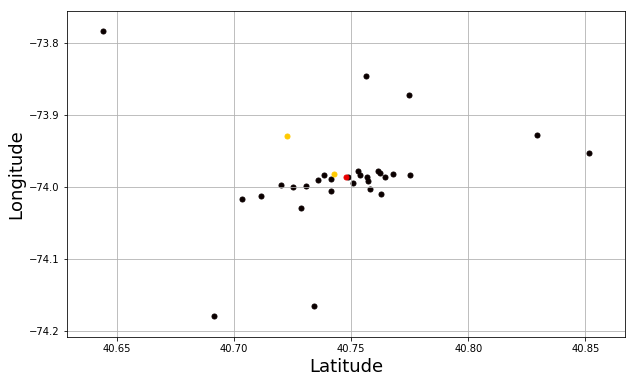

In [78]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cmx
import matplotlib.colors as colors

fig = plt.figure(figsize=(10,6))
cmap=plt.cm.rainbow
norm = matplotlib.colors.BoundaryNorm(np.arange(0,10,1), cmap.N)

# Get unique names of species
uniq = list(set(sample['type']))

# Set the color map to match the number of species
z = range(1,len(uniq))
hot = plt.get_cmap('hot')
cNorm  = colors.Normalize(vmin=0, vmax=len(uniq))
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=hot)

x=sample['lat']
y=sample['lon']

for i in range(len(uniq)):
    indx = sample['type'] == uniq[i]
    plt.scatter(x[indx], y[indx], s=25, color=scalarMap.to_rgba(i), label=uniq[i])

#plt.scatter(sample['lon'], sample['lat'],
#            cmap=cmap, norm=norm, s=150, edgecolor='none')
plt.xlabel('Latitude', fontsize=18)
plt.ylabel('Longitude', fontsize=18)
plt.grid()
plt.show()

In [384]:
#!pip3 install -U seaborn

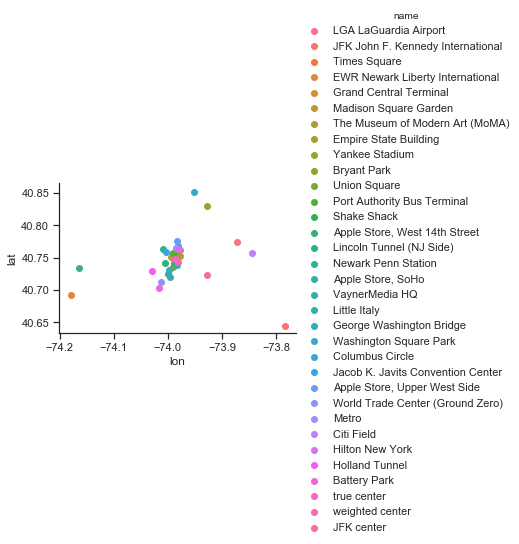

In [79]:
from  matplotlib import pyplot
import seaborn
seaborn.set(style='ticks')
fg = seaborn.FacetGrid(data=sample, hue='name', aspect=1.61)
fg.map(pyplot.scatter, 'lon', 'lat').add_legend()

In [397]:
#!pip3 install -U hdbscan

##### Idea: 

Hacer clustering primero y eliminar los destinos anómalos del documento antes Luego calcular el central sin outliers

Mejor:

Tomar todos las geo localizaciones de todos los documentos. Elimnar outliers???? NO... madurar!! 


In [80]:
import hdbscan
X = sample[['lon','lat']].values
rads = np.radians(X)
clusterer = hdbscan.HDBSCAN(min_cluster_size=2, metric='haversine')
predictions = clusterer.fit_predict(rads)


clustered = pd.concat([sample.reset_index(), 
                       pd.DataFrame({'cluster':predictions})], 
                      axis=1)
clustered.drop('index', axis=1, inplace=True)

In [453]:
clustered

,lat,lon,name,cluster
0,40.774578,-73.872006,LGA LaGuardia Airport,-1
1,40.643885,-73.782806,JFK John F. Kennedy International,-1
2,40.756880,-73.986225,Times Square,7
3,40.691247,-74.179516,EWR Newark Liberty International,0
4,40.752792,-73.977256,Grand Central Terminal,4
5,40.750614,-73.993435,Madison Square Garden,5
6,40.761255,-73.977580,The Museum of Modern Art (MoMA),4
7,40.748444,-73.985732,Empire State Building,7
8,40.829406,-73.927431,Yankee Stadium,1
9,40.753816,-73.983618,Bryant Park,7


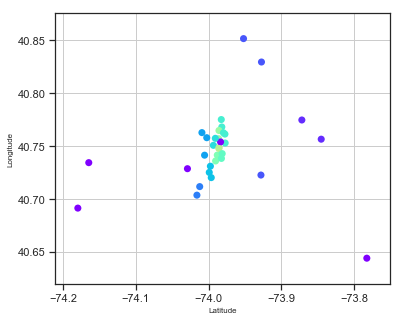

In [81]:
fig = plt.figure(figsize=(6,5))
cmap=plt.cm.rainbow
norm = matplotlib.colors.BoundaryNorm(np.arange(0,20,1), cmap.N)

plt.scatter(clustered['lon'], clustered['lat'],
            cmap=cmap, norm=norm, s=50, edgecolor='none', c=clustered['cluster'])
plt.xlabel('Latitude', fontsize=8)
plt.ylabel('Longitude', fontsize=8)
plt.grid()
plt.show()

In [82]:
# Create a geojson file export from a Pandas dataframe
data = df_to_geojson(clustered, properties=['name','cluster'],
              lat='lat', lon='lon', precision=3)


#color_stops = create_color_stops(clustered['cluster'], colors='YlOrRd')
#print(color_stops)
# Create the viz from the dataframe
viz = CircleViz(data, 
                height='450px',
                color_default='red', 
                access_token=token,
                color_property="cluster",
                radius=2.5,
                label_property = "name",
                #color_stops=color_stops,
                center = (-74.069539, 40.707562),
                zoom = 10,
                below_layer = 'waterway-label',
                legend_gradient = True
              )

viz.show()

/Users/jose/Documents/GitHub/spacial_rec_sys/.venv/lib/python3.6/site-packages/IPython/core/display.py:689: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


In [83]:
from mapboxgl.utils import *
from mapboxgl.viz import *

data = df_to_geojson(sample, properties=['name'],
              lat='lat', lon='lon', precision=3)

heatmap_color_stops = create_color_stops([0.01,0.25,0.5,0.75,1], colors='RdPu')
heatmap_radius_stops = [[0,1], [15, 40]] #increase radius with zoom

color_breaks = [0,10,100,1000,10000]
color_stops = create_color_stops(color_breaks, colors='Spectral')

heatmap_weight_stops = create_weight_stops(color_breaks)

#Create a heatmap
viz = HeatmapViz(data,
                  access_token=token,
                  weight_property='name',
                  weight_stops=heatmap_weight_stops,
                  color_stops=heatmap_color_stops,
                  radius_stops=heatmap_radius_stops,
                  opacity=0.9,
                  center = (-74.069539, 40.707562),
                  zoom=10,
                  below_layer='waterway-label')

viz.show()

In [569]:
with open('map1.html', 'w') as f:
    f.write(viz.create_html())

In [570]:
!python3 -m http.server 8080

Serving HTTP on 0.0.0.0 port 8080 (http://0.0.0.0:8080/) ...
127.0.0.1 - - [06/Apr/2019 22:24:07] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [06/Apr/2019 22:24:12] "GET /map1.html HTTP/1.1" 200 -
^C

Keyboard interrupt received, exiting.


### Voronoi

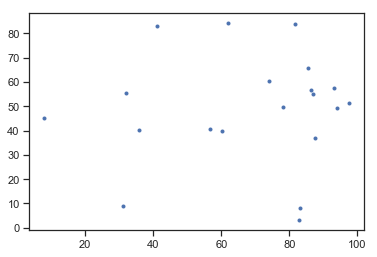

In [86]:

df = pd.DataFrame(np.random.uniform(1,100,size=(20, 2)), columns=list('XY'))
plt.scatter(df.X, df.Y,marker=".")

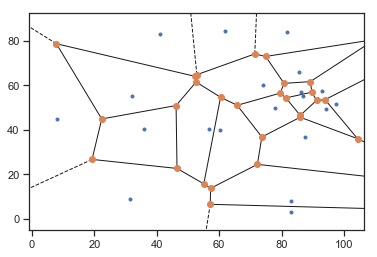

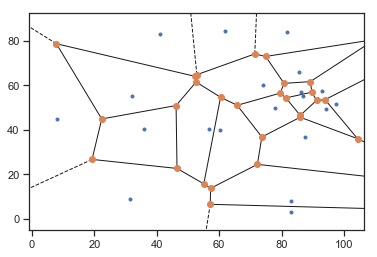

In [87]:
from scipy.spatial import Voronoi, voronoi_plot_2d
vor = Voronoi(df)
voronoi_plot_2d(vor)

In [88]:
from scipy.spatial import cKDTree
vor_kdtree = cKDTree(df)
puntos = [[1,100],[100,1]]
test_point_dist, test_point_regions = vor_kdtree.query(puntos,k=1)
test_point_regions

array([10, 15])

In [89]:
vor.point_region

array([ 5, 11, 14, 12,  6,  9,  2, 13, 18, 15,  7, 10,  3, 17, 19,  1, 20,
        8, 16,  4])

In [90]:
pd.concat([df,pd.DataFrame(vor.point_region)],axis=1)

,X,Y,0
0,97.418215,51.440824,5
1,31.272182,8.922458,11
2,94.076749,49.449081,14
3,87.460214,36.817647,12
4,61.832455,84.353764,6
5,83.047377,8.177714,9
6,35.930088,40.261146,2
7,60.242977,39.981199,13
8,86.840386,55.073163,18
9,86.306865,56.791123,15
